In [1]:
import sys

In [2]:
import scvelo as scv
import scanpy as sc
import cellrank as cr
import numpy as np

scv.settings.verbosity = 3
scv.settings.set_figure_params("scvelo")
cr.settings.verbosity = 2

In [3]:
import warnings
warnings.simplefilter("ignore", category=UserWarning)
warnings.simplefilter("ignore", category=FutureWarning)
warnings.simplefilter("ignore", category=DeprecationWarning)

In [4]:
import os
os.getcwd()

'/Volumes/groups/tanaka/People/current/jiwang/projects/RA_competence/scripts'

In [5]:
input_Dir = "../results/scRNAseq_R13547_10x_mNT_20220813/RA_symetryBreaking/"
outDir = "../results/scRNAseq_R13547_10x_mNT_20220813/RA_symetryBreaking/branching_genes_BGP/"

In [6]:
data_seuratObj = os.path.join(input_Dir, "RNAmatrix_umap_alevin.spliced_unspliced_RA_noNeurons_d2.beforeRA_downsample_10.5k.h5ad")
adata = sc.read_h5ad(data_seuratObj, chunk_size=6000)

In [7]:
adata

AnnData object with n_obs × n_vars = 10500 × 15871
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'condition', 'iscell_dd', 'cell.id', 'percent.mt', 'DF_out', 'percent.rb', 'S.Score', 'G2M.Score', 'Phase', 'celltypes', 'RNA_snn_res.0.7', 'seurat_clusters', 'clusters', 'time', 'nCount_spliced', 'nFeature_spliced', 'nCount_unspliced', 'nFeature_unspliced'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'spliced_features', 'unspliced_features'
    obsm: 'X_umap'
    layers: 'spliced', 'unspliced'

In [8]:
adata.layers.keys()

KeysView(Layers with keys: spliced, unspliced)

In [9]:
adata.obs['condition']= adata.obs['condition'].astype('category') # change the condition into category type
adata.obs['celltypes']= adata.obs['celltypes'].astype('category')
adata.obs['clusters']= adata.obs['clusters'].astype('category')

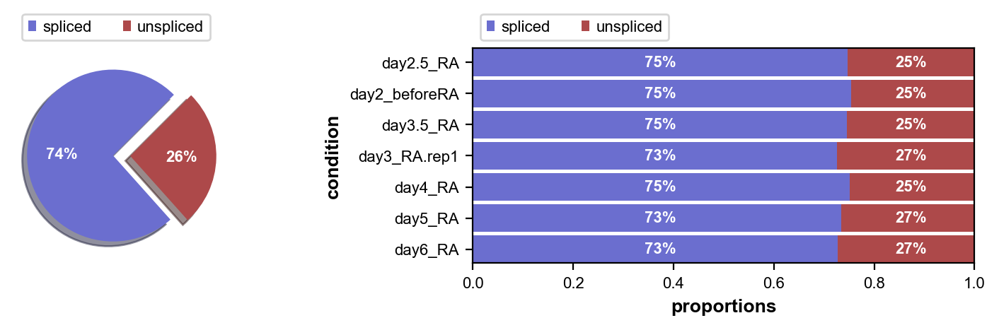

In [10]:
#adata = cr.datasets.pancreas()
scv.pl.proportions(adata, groupby='condition')

In [11]:
scv.pp.filter_and_normalize(adata, 
                            min_shared_counts=20, n_top_genes=3000, 
                            flavor = 'seurat', 
                            layers_normalize={'X', 'spliced', 'unspliced'}) # by specifying layers_normalize to renormalize the counts 
sc.tl.pca(adata)
sc.pp.neighbors(adata, n_pcs=30, n_neighbors=30)
scv.pp.moments(adata, n_pcs=None, n_neighbors=None)

Filtered out 5347 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 3000 highly variable genes.


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


computing moments based on connectivities
    finished (0:00:03) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [12]:
## test diffusion map in scanpy
sc.tl.diffmap(adata, n_comps = 30)

In [16]:
adata
#sc.pl.diffmap(adata) # not working so well
#sc.pp.neighbors(adata, n_neighbors=10, use_rep='X_diffmap')

AnnData object with n_obs × n_vars = 10500 × 3000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'condition', 'iscell_dd', 'cell.id', 'percent.mt', 'DF_out', 'percent.rb', 'S.Score', 'G2M.Score', 'Phase', 'celltypes', 'RNA_snn_res.0.7', 'seurat_clusters', 'clusters', 'time', 'nCount_spliced', 'nFeature_spliced', 'nCount_unspliced', 'nFeature_unspliced', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'spliced_features', 'unspliced_features', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable'
    uns: 'pca', 'neighbors', 'diffmap_evals'
    obsm: 'X_umap', 'X_pca', 'X_diffmap'
    varm: 'PCs'
    layers: 'spliced', 'unspliced', 'Ms', 'Mu'
    obsp: 'distances', 'connectivities'

In [17]:
scv.tl.recover_dynamics(adata, n_jobs=10, max_iter=10) # slow step and require high memory ~120G, so it is better to start the jupterlab with 150G RAM (~15-20mins)

recovering dynamics (using 10/10 cores)
or disable the progress bar using `show_progress_bar=False`.
    finished (0:02:29) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


In [18]:
adata 

AnnData object with n_obs × n_vars = 10500 × 3000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'condition', 'iscell_dd', 'cell.id', 'percent.mt', 'DF_out', 'percent.rb', 'S.Score', 'G2M.Score', 'Phase', 'celltypes', 'RNA_snn_res.0.7', 'seurat_clusters', 'clusters', 'time', 'nCount_spliced', 'nFeature_spliced', 'nCount_unspliced', 'nFeature_unspliced', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'spliced_features', 'unspliced_features', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_scaling'
    uns: 'pca', 'neighbors', 'diffmap_evals', 'recover_dynamics'
    obsm: 'X_umap', 'X_pca', 'X_diffm

In [19]:
# save the velocity result
adata.write(os.path.join(outDir, 'my_results_velocity_recover_dynamics.h5ad'), compression="gzip")

In [ ]:
# reload the calculated velocity from tl.recover_dynamics
adata = sc.read_h5ad(os.path.join(outDir,'my_results_velocity_recover_dynamics.h5ad'), chunk_size=6000)

In [20]:
scv.tl.velocity(adata, mode="dynamical")

computing velocities
    finished (0:00:07) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


computing velocity graph (using 1/10 cores)
    finished (0:00:15) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:01) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


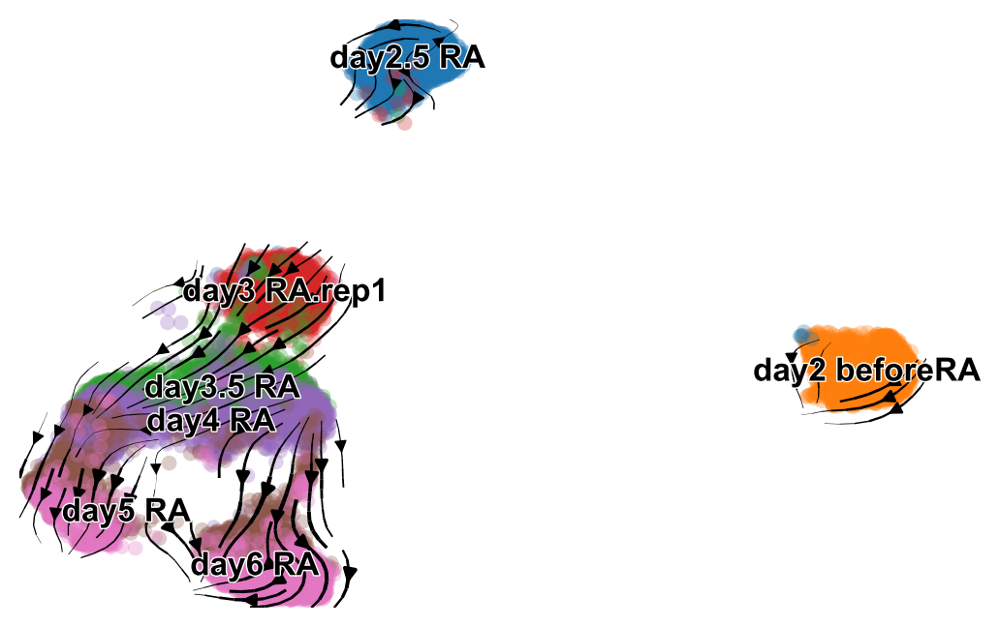

In [21]:
scv.tl.velocity_graph(adata, approx = None, sqrt_transform = None)
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.5, min_mass=1,
    legend_fontsize=12, title="", color = "condition"
)

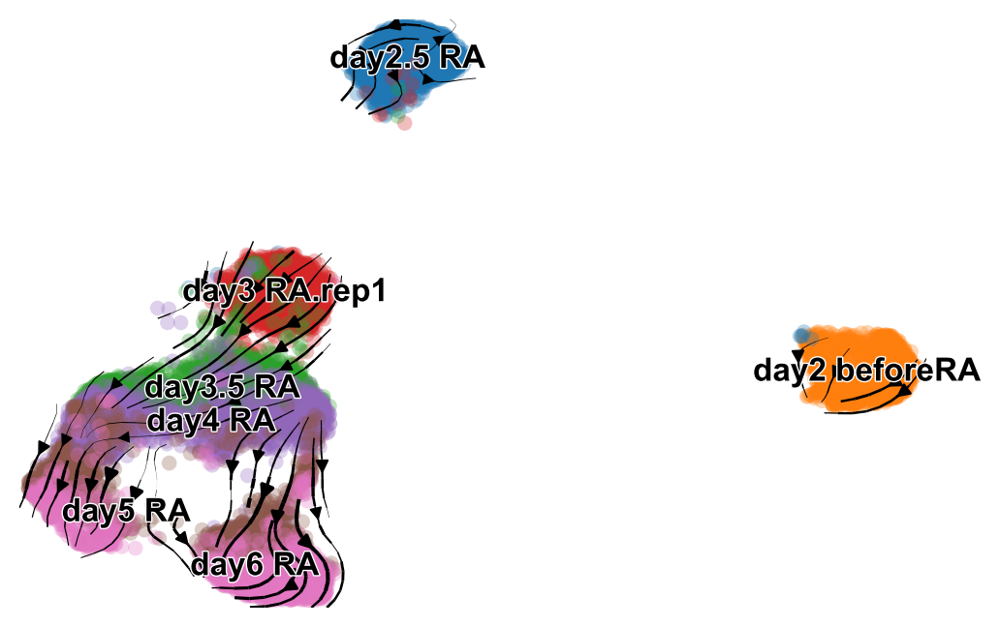

In [23]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.4, min_mass=1,
    legend_fontsize=12, title="", color = "condition"
)

saving figure to file ../results/scRNAseq_R13547_10x_mNT_20220813/RA_symetryBreaking/branching_genes_BGP/RNAvelocity_stream_model_dynamical_stream_top3000.pdf


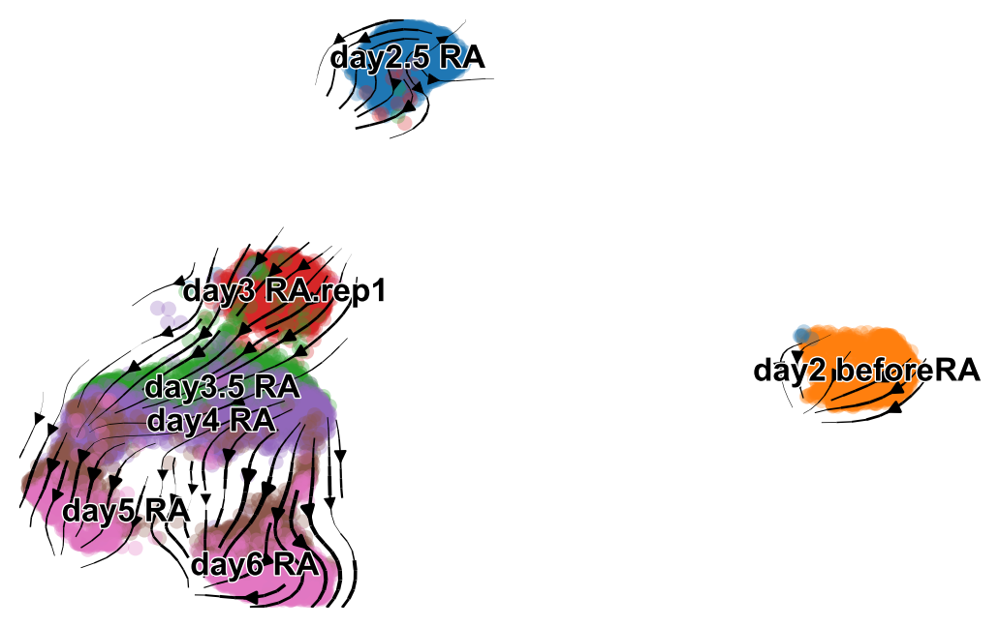

In [24]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.6, min_mass=1,
    legend_fontsize=12, title="", color = "condition", 
    save=os.path.join(outDir, "RNAvelocity_stream_model_dynamical_stream_top3000.pdf"))

In [25]:
#scv.tl.velocity(adata, mode="stochastic")
scv.tl.velocity(adata, mode="steady_state")

computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


computing velocity graph (using 1/10 cores)
    finished (0:00:15) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:01) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


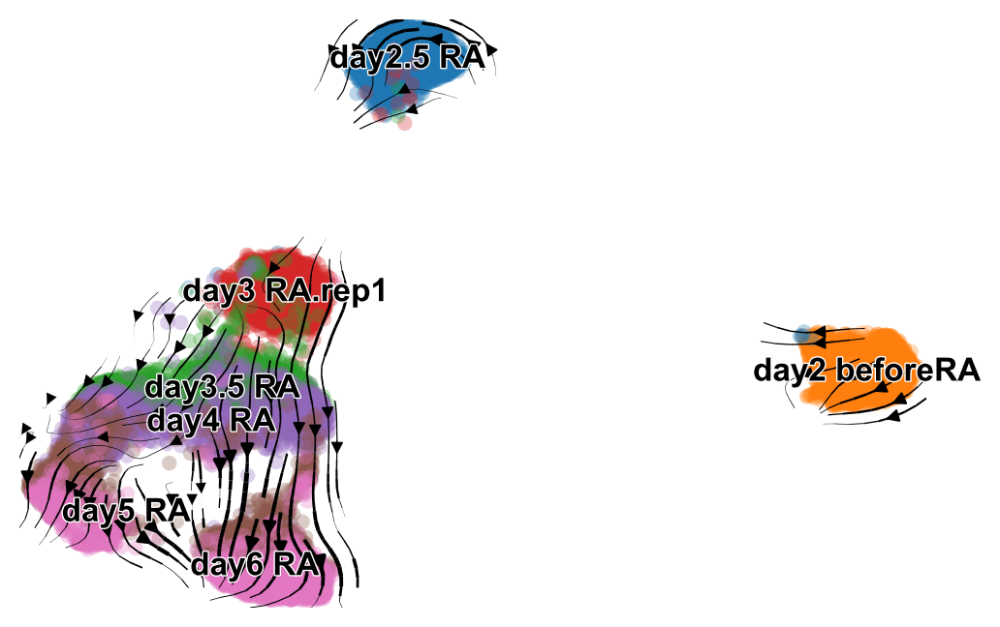

In [26]:
scv.tl.velocity_graph(adata, approx = None, sqrt_transform = None)
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.6, min_mass=1,
    legend_fontsize=12, title="", color = "condition"
)

saving figure to file ../results/scRNAseq_R13547_10x_mNT_20220813/RA_symetryBreaking/branching_genes_BGP/RNAvelocity_stream_model_steadystat_stream_top3000.pdf


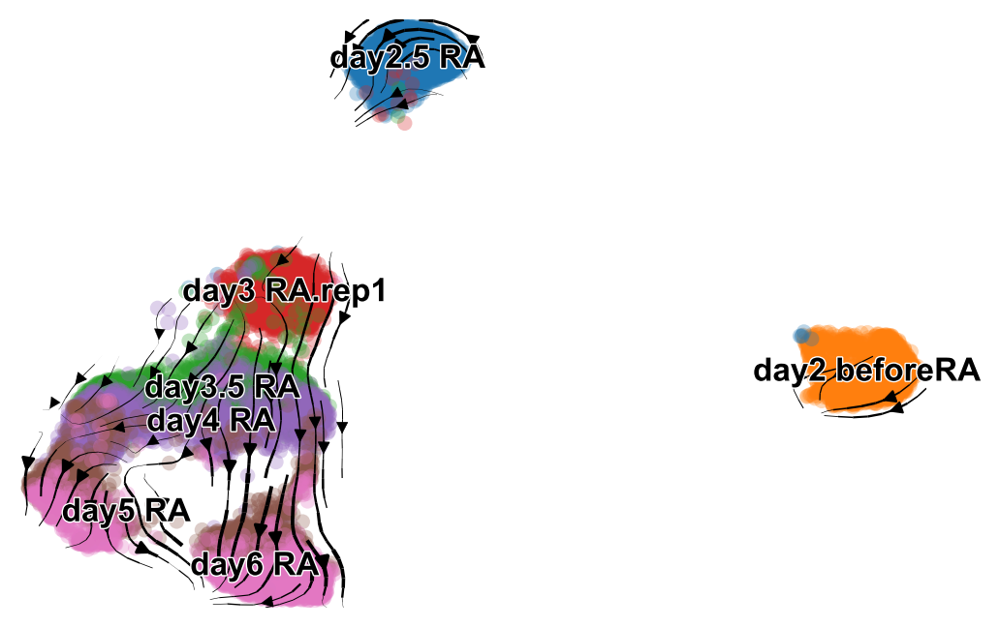

In [28]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.5, min_mass=1,
    legend_fontsize=12, title="", color = "condition", 
    save=os.path.join(outDir, "RNAvelocity_stream_model_steadystat_stream_top3000.pdf"))

computing velocities
    finished (0:00:04) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/10 cores)
    finished (0:00:34) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:01) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


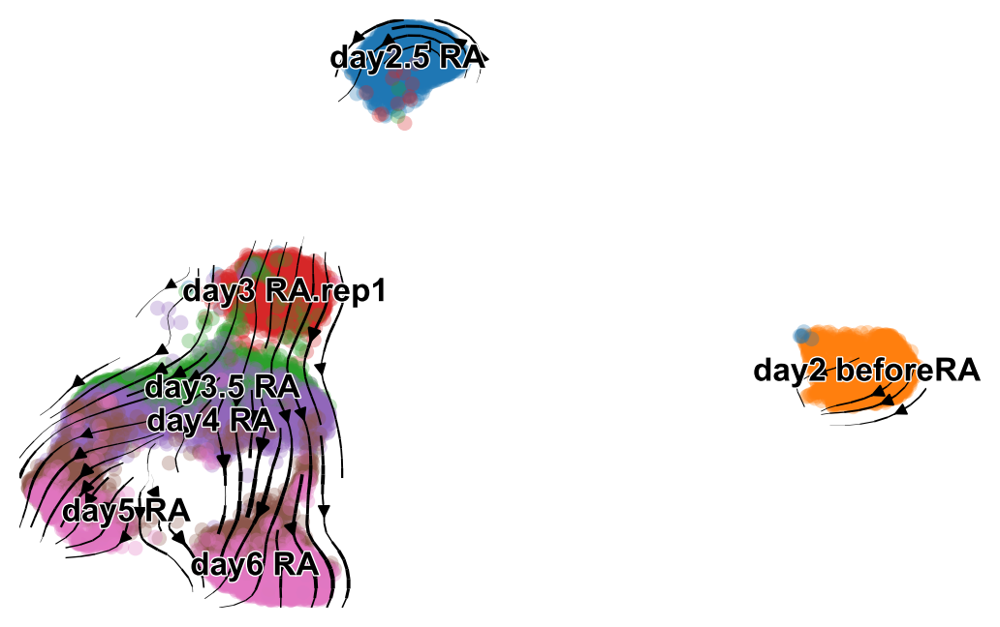

In [29]:
scv.tl.velocity(adata, mode="stochastic")
scv.tl.velocity_graph(adata)
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.5, min_mass=1,
    legend_fontsize=12, title="", color = "condition"
)

figure cannot be saved as pdf, using png instead.
saving figure to file ../results/scRNAseq_R13547_10x_mNT_20220813/RA_symetryBreaking/branching_genes_BGP/RNAvelocity_model_stochastic_stream_top3000.png


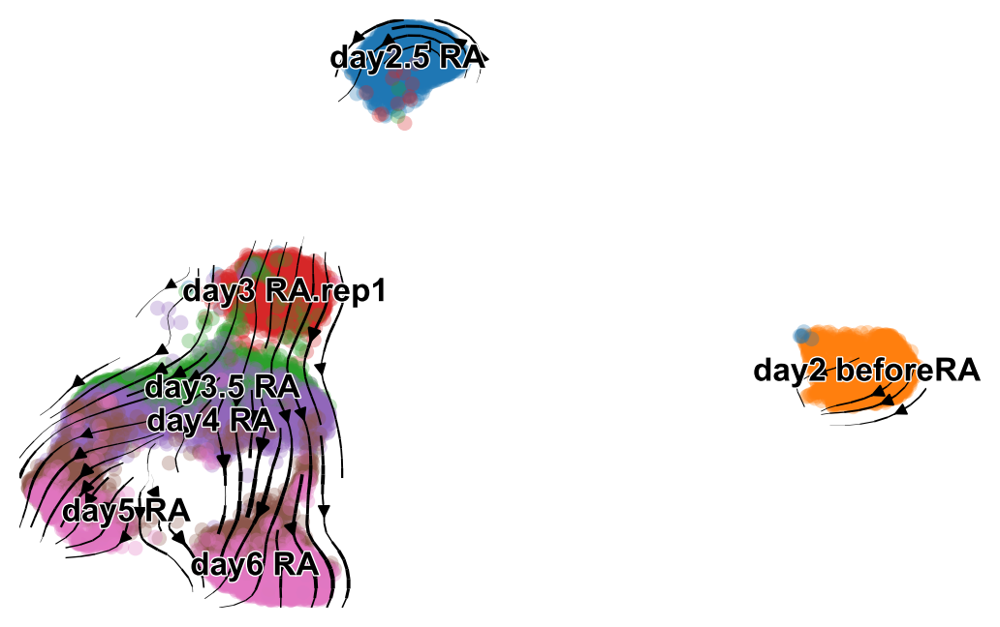

In [31]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.5, min_mass=1,
    legend_fontsize=12, title="", color = "condition", 
    save=os.path.join(outDir, "RNAvelocity_model_stochastic_stream_top3000.pdf"))

In [32]:
# compare three models and it seems that the steady state works relatively better for root and terminal cells

In [34]:
scv.tl.velocity(adata, mode="dynamical") # test dynamical model
#scv.tl.velocity(adata, mode="steady_state")
#scv.tl.velocity(adata, mode="stochastic") # test dynamical model
scv.tl.velocity_graph(adata)

computing velocities
    finished (0:00:08) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/10 cores)
    finished (0:00:15) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


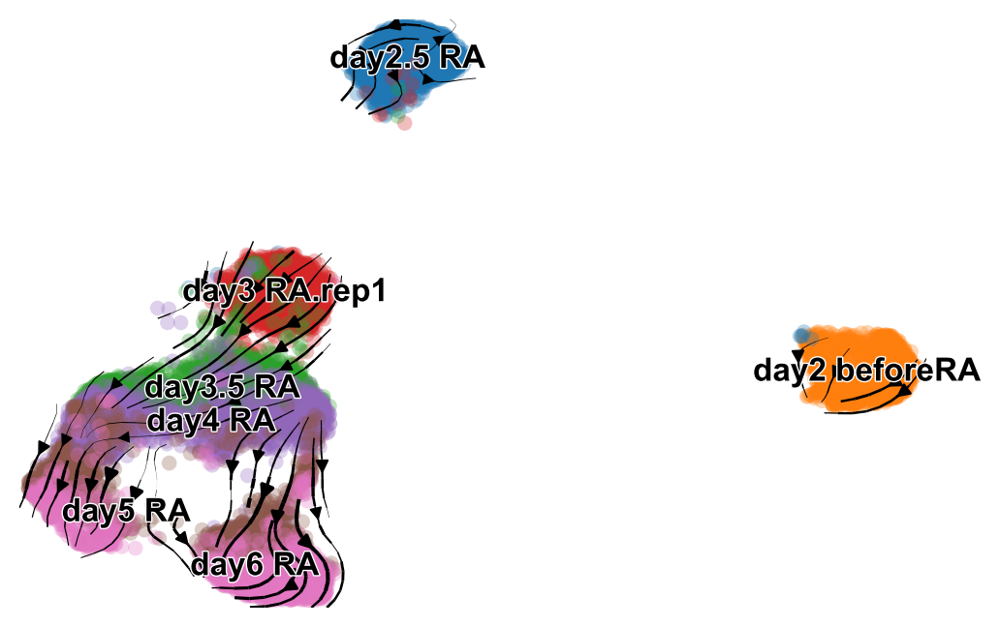

In [36]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.4, min_mass=1,
    legend_fontsize=12, title="", color = "condition"
)

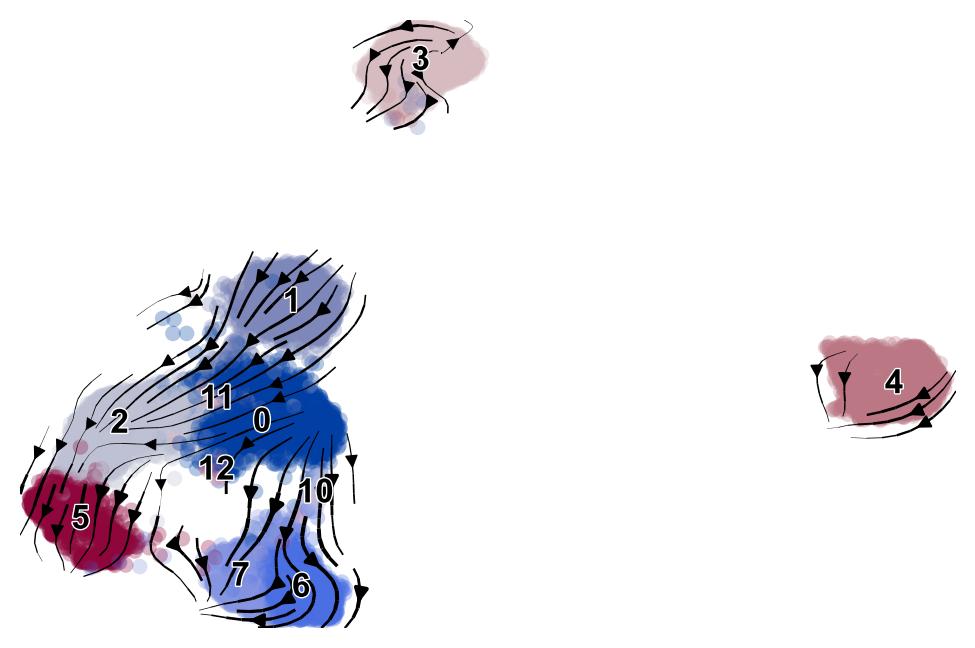

In [37]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.5, min_mass=1,
    legend_fontsize=12, title="", color = "clusters"
)

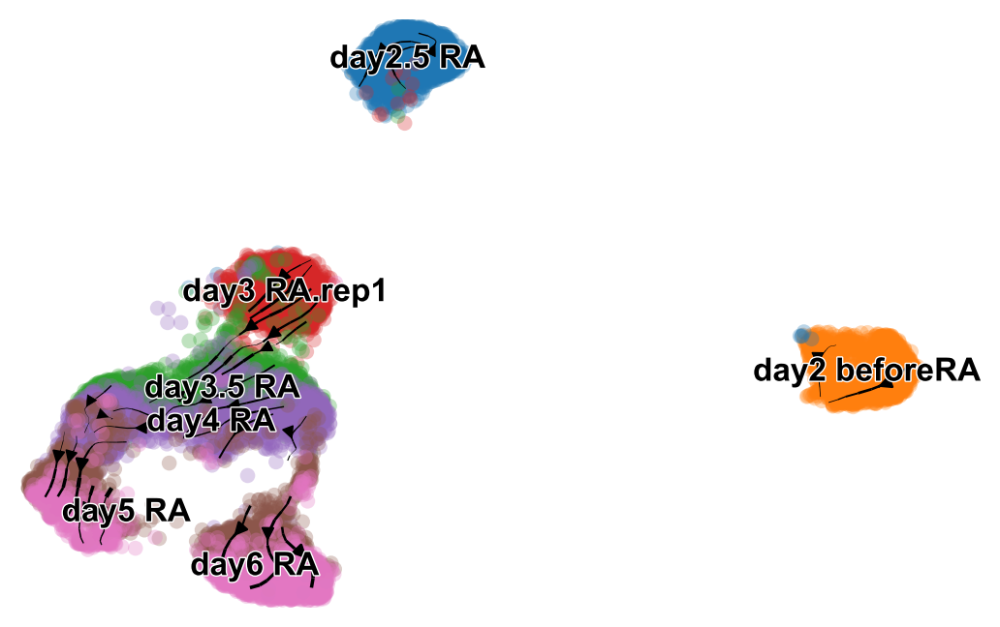

In [38]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.1, min_mass=1,
    legend_fontsize=12, title="", color = "condition"
)

In [39]:
adata

AnnData object with n_obs × n_vars = 10500 × 3000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'condition', 'iscell_dd', 'cell.id', 'percent.mt', 'DF_out', 'percent.rb', 'S.Score', 'G2M.Score', 'Phase', 'celltypes', 'RNA_snn_res.0.7', 'seurat_clusters', 'clusters', 'time', 'nCount_spliced', 'nFeature_spliced', 'nCount_unspliced', 'nFeature_unspliced', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'spliced_features', 'unspliced_features', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_scaling', 'velocity_genes', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2'


computing velocity embedding
    finished (0:00:04) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)


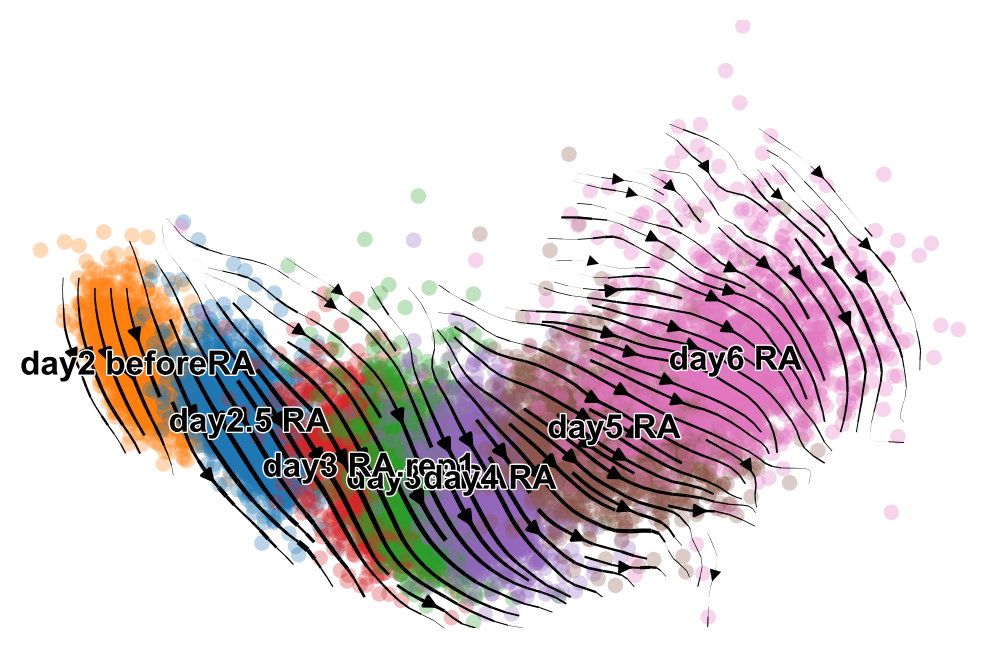

In [40]:
scv.pl.velocity_embedding_stream(
    adata, basis="pca", smooth=0.4, min_mass=0.5,
    legend_fontsize=12, title="", color = "condition"
)

In [41]:
print(adata.var.velocity_genes.sum()) # check the genes used for RNA velocity

1282


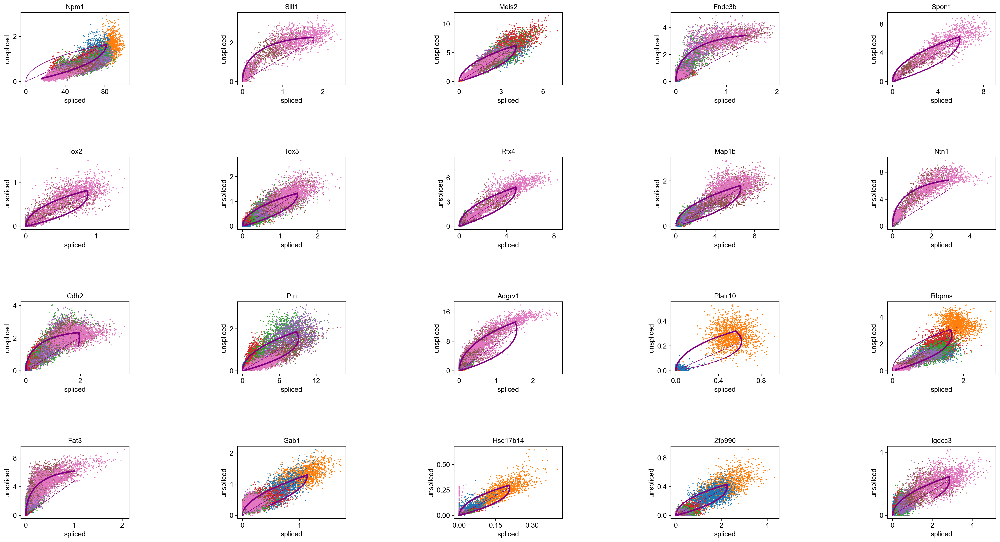

In [42]:
## top genes
top_genes = adata.var.sort_values('fit_likelihood', ascending=False).index[:20]
scv.pl.scatter(adata, basis=top_genes, color="condition", wspace=1, hspace=1, nrows=4, ncols=5)

In [43]:
# scv.pl.velocity_embedding(adata, basis="umap", arrow_length=3, arrow_size=2, dpi=120, color = "condition")
# scv.pl.velocity_embedding(adata, basis='umap',color='cell.type.fine',arrow_length=5)
# scv.pl.velocity_embedding_grid(adata, basis='umap',color='seurat_clusters',arrow_length=5)

In [44]:
#####latent time
#scv.tl.terminal_states(adata)
#scv.tl.latent_time(adata)
#scv.pl.scatter(adata, color='latent_time',color_map='gnuplot', size=80)
#scv.pl.scatter(adata, color=[ 'root_cells', 'end_points'])

In [45]:
# save the scvelo result
adata
adata.write(os.path.join(outDir,'my_results_scvelo_stochastic.h5ad'), compression="gzip")

In [30]:
################# 
# Run CellRank using kernel functions -- https://cellrank.readthedocs.io/en/stable/kernels_and_estimators.html
# 
#################

In [ ]:
adata = sc.read_h5ad(os.path.join(outDir,'my_results_scvelo_stochastic.h5ad'), chunk_size=6000)

In [49]:
adata

AnnData object with n_obs × n_vars = 10500 × 3000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'condition', 'iscell_dd', 'cell.id', 'percent.mt', 'DF_out', 'percent.rb', 'S.Score', 'G2M.Score', 'Phase', 'celltypes', 'RNA_snn_res.0.7', 'seurat_clusters', 'clusters', 'time', 'nCount_spliced', 'nFeature_spliced', 'nCount_unspliced', 'nFeature_unspliced', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'dpt_pseudotime'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'spliced_features', 'unspliced_features', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_scaling', 'velocity_genes', 'velocity_gamma', 'velocity_qreg_rati

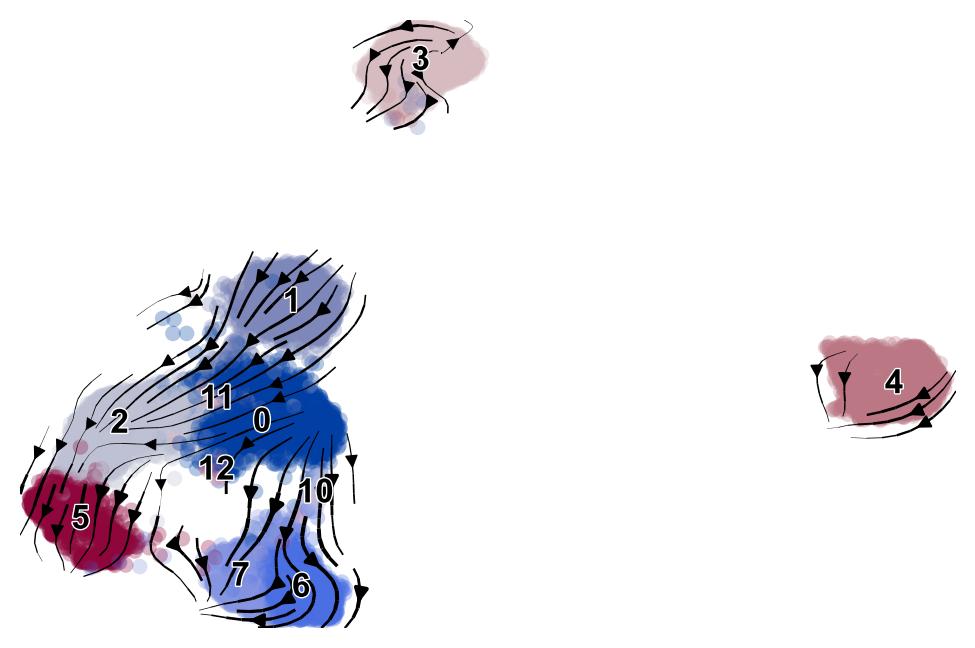

In [46]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.5, min_mass=1,
    legend_fontsize=12, title="", color = "clusters"
)

In [50]:
adata.uns['iroot'] = np.flatnonzero(adata.obs['clusters']  == '4')[0]


In [55]:
sc.tl.dpt(adata)

saving figure to file ../results/scRNAseq_R13547_10x_mNT_20220813/RA_symetryBreaking/branching_genes_BGP/scvelo_dpt_pseudotime.pdf


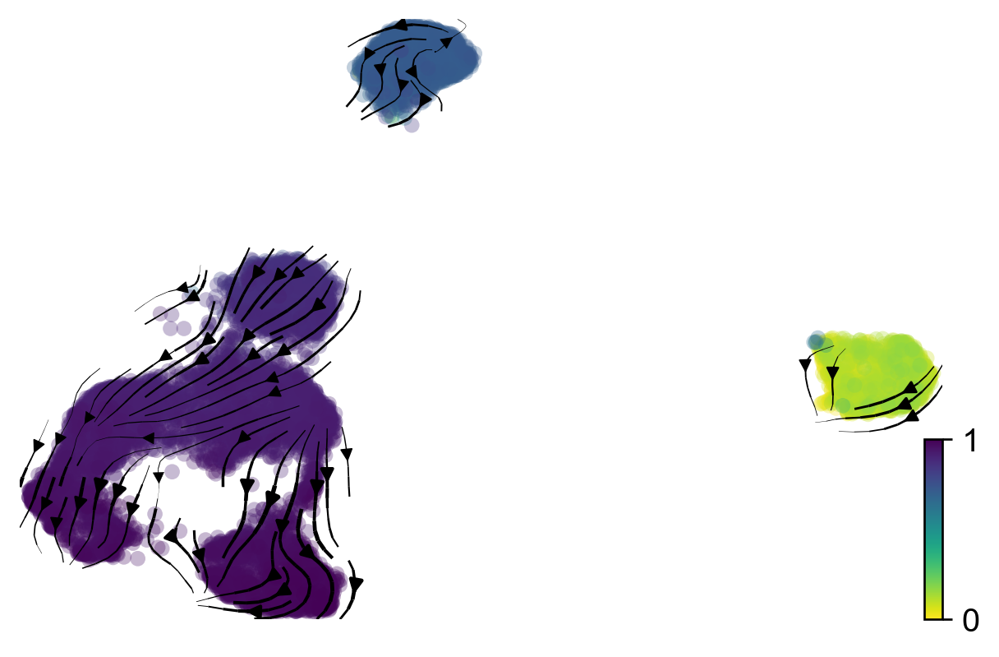

In [56]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.5, min_mass=1,
    legend_fontsize=12, title="", color = "dpt_pseudotime",
    dpi = 120,
    save=os.path.join(outDir, "scvelo_dpt_pseudotime.pdf")
)

saving figure to file ../results/scRNAseq_R13547_10x_mNT_20220813/RA_symetryBreaking/branching_genes_BGP/scvelo_condition.pdf


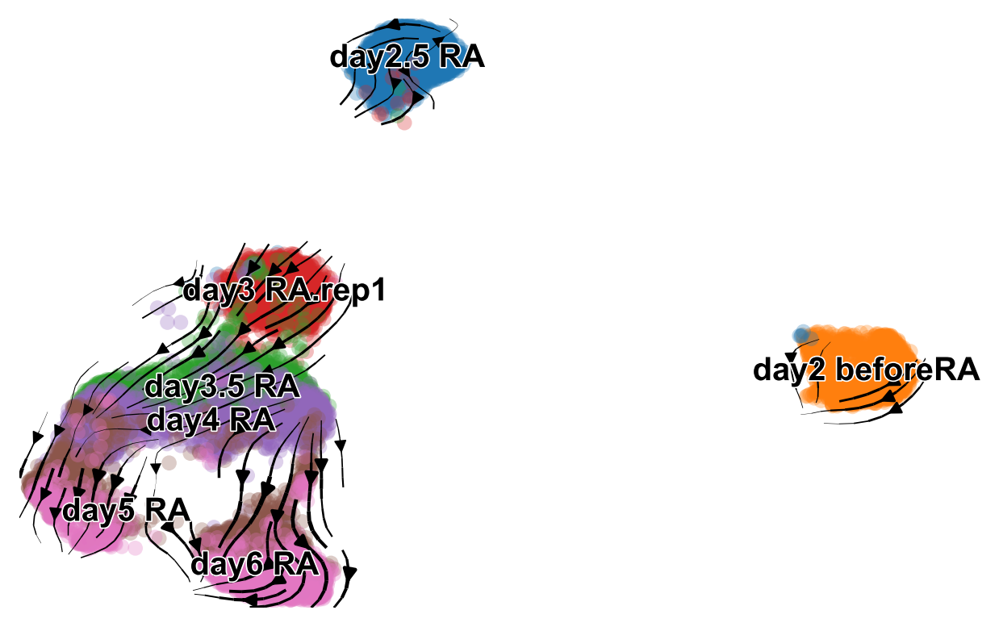

In [57]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.5, min_mass=1,
    legend_fontsize=12, title="", color = "condition",
    dpi = 120, 
    save=os.path.join(outDir, "scvelo_condition.pdf")
)

saving figure to file ../results/scRNAseq_R13547_10x_mNT_20220813/RA_symetryBreaking/branching_genes_BGP/scatter_condition.pdf


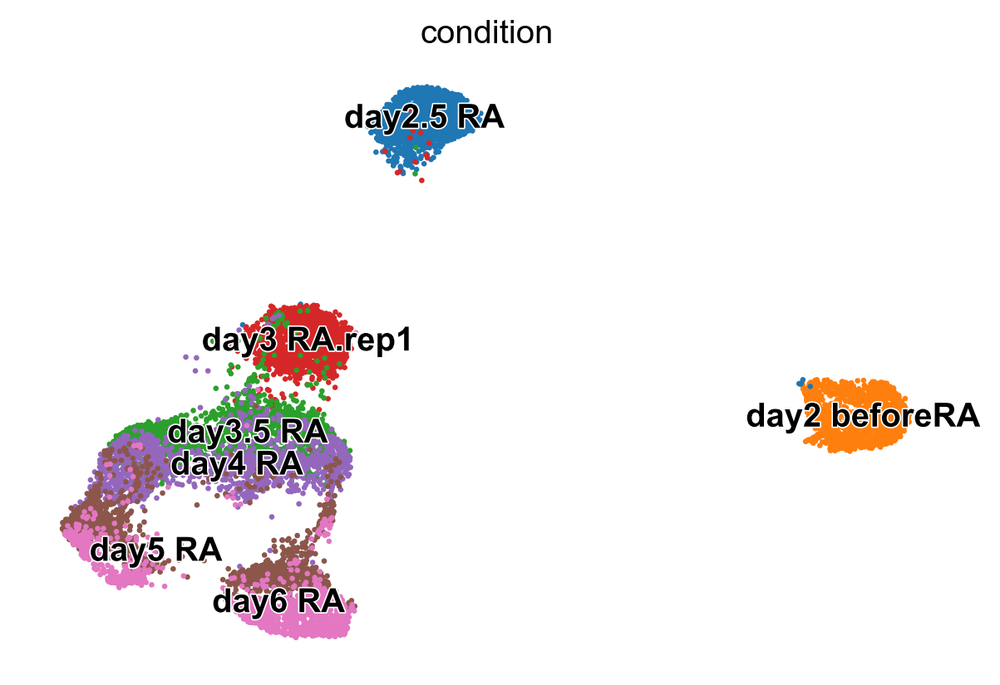

In [58]:
scv.pl.scatter(adata, basis="umap", c="condition",
                dpi = 120, 
                save=os.path.join(outDir, "scatter_condition.pdf")
              )

In [59]:
from cellrank.tl.kernels import VelocityKernel
vk = VelocityKernel(adata)
pk = cr.tl.kernels.PseudotimeKernel(adata)

In [60]:
# Compute a transition matrix
pk.compute_transition_matrix()
vk.compute_transition_matrix()

Computing transition matrix based on `dpt_pseudotime`


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10500/10500 [00:01<00:00, 6175.14cell/s]
/Users/jingkui.wang/anaconda3/envs/cellrank/lib/python3.7/site-packages/cellrank/tl/_utils.py:719: DeprecationWarning: 

The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `from_scipy_sparse_array` instead.
  G = nx.from_scipy_sparse_matrix(c) if issparse(c) else nx.from_numpy_array(c)


    Finish (0:00:04)
Computing transition matrix based on logits using `'deterministic'` mode
Estimating `softmax_scale` using `'deterministic'` mode


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10500/10500 [01:05<00:00, 159.52cell/s]

Setting `softmax_scale=7.5942`



100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10500/10500 [01:04<00:00, 163.04cell/s]

    Finish (0:02:11)


<VelocityKernel>

In [61]:
# Combining multiple kernels
from cellrank.tl.kernels import ConnectivityKernel
ck = ConnectivityKernel(adata).compute_transition_matrix()

Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)


In [62]:
combined_kernel = 0.5 * vk + 0.3 *pk + 0.2 * ck
#combined_kernel = 0.8 * vk + 0.2 * ck
#combined_kernel = 0.8 * vk + 0.2 * ck

In [63]:
# Initialize an estimator
from cellrank.tl.estimators import GPCCA

g = GPCCA(combined_kernel)
print(g)

GPCCA[n=10500, kernel=((0.5 * <VelocityKernel[softmax_scale=7.59, mode=deterministic, seed=29217, scheme=<CorrelationScheme>]>) + (0.3 * <PseudotimeKernel[dnorm=False, scheme=hard, frac_to_keep=0.3]>) + (0.2 * <ConnectivityKernel[dnorm=True, key=connectivities]>))]


Computing Schur decomposition
Mat Object: 1 MPI processes
  type: seqdense
1.0000000000000000e+00 -1.1660753064326938e-03 -1.9743758611506238e-02 1.4173303296700582e-02 5.9156592101635812e-03 3.1141570897380753e-02 4.7742027780914950e-02 
0.0000000000000000e+00 9.9715006649516502e-01 8.9236850041876092e-03 -7.7513757080451967e-03 -2.9323204651779040e-03 -1.0247690357422614e-02 -1.6314904727019828e-02 
0.0000000000000000e+00 0.0000000000000000e+00 9.8564026645174596e-01 1.1700301551467000e-02 -2.0141209349116767e-02 1.1872812233850815e-02 3.2807629745212737e-02 
0.0000000000000000e+00 0.0000000000000000e+00 0.0000000000000000e+00 9.6048646833069107e-01 5.7611186958918384e-02 -3.8071047523594762e-02 -1.0424239723565910e-02 
0.0000000000000000e+00 0.0000000000000000e+00 0.0000000000000000e+00 0.0000000000000000e+00 9.4818026719835391e-01 5.5122101084975242e-02 -1.5865482820305275e-02 
0.0000000000000000e+00 0.0000000000000000e+00 0.0000000000000000e+00 0.0000000000000000e+00 0.00000000000

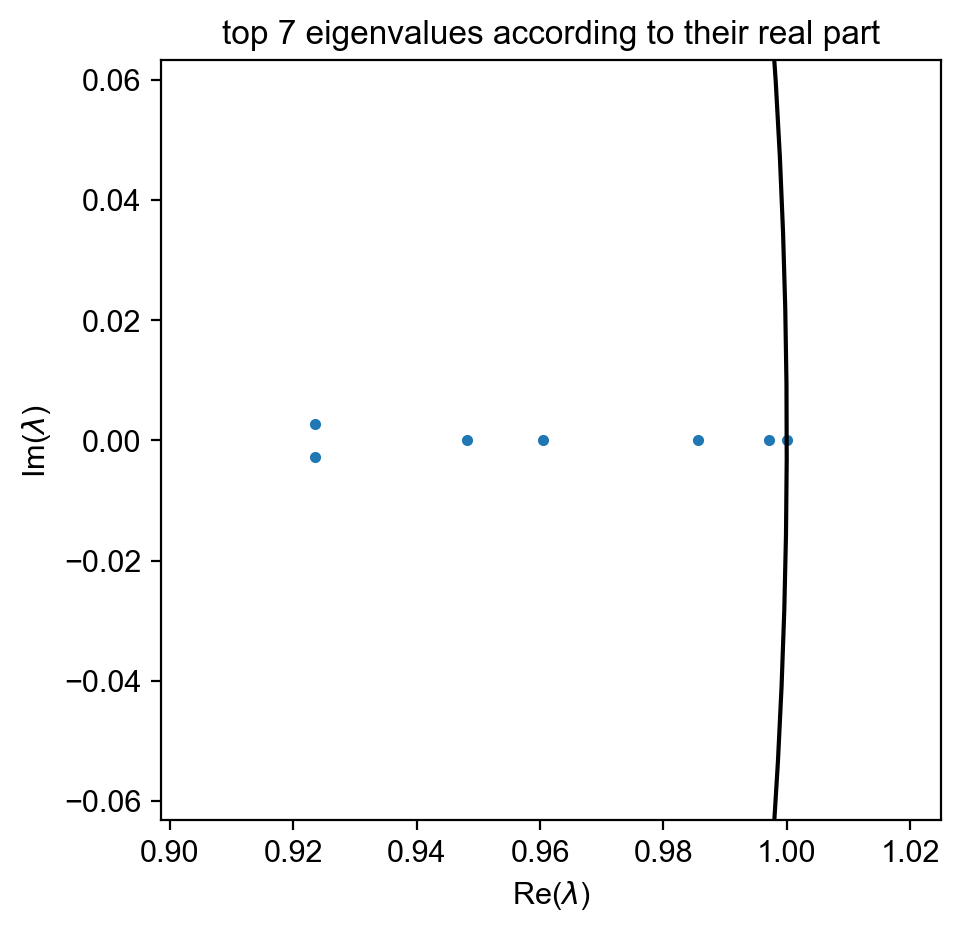

In [64]:
# Compute a matrix decomposition
g.compute_schur(n_components=6) # method with 'brandts', otherwise kernel will be killed; take really a long time for 40k cells 
g.plot_spectrum()

Computing `7` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:06)


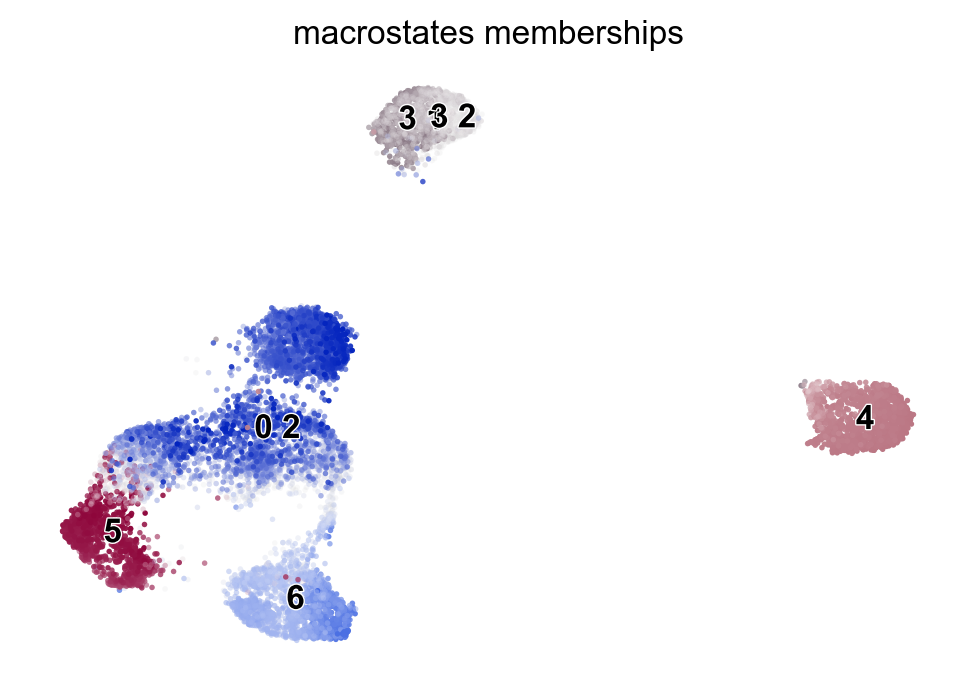

In [65]:
# Infer terminal states
g.compute_macrostates(n_states = 6, cluster_key="clusters")
g.plot_macrostates()

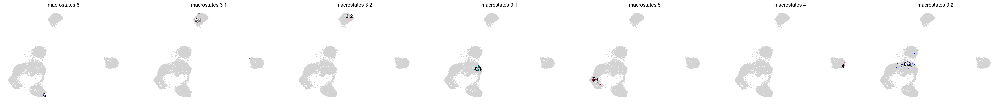

In [66]:
g.plot_macrostates(same_plot=False, discrete=True)

In [68]:
g.set_terminal_states({"NP": adata[adata.obs["clusters"] == "5"].obs_names}, add_to_existing=False)
g.set_terminal_states({"FP": adata[adata.obs["clusters"] == "6"].obs_names}, add_to_existing=True)

Adding `adata.obs['terminal_states']`
       `adata.obs['terminal_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`
Adding `adata.obs['terminal_states']`
       `adata.obs['terminal_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


In [69]:
g.compute_absorption_probabilities()

Computing absorption probabilities


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 20.18/s]

Adding `adata.obsm['to_terminal_states']`
       `.absorption_probabilities`
    Finish (0:00:00)


saving figure to file ../results/scRNAseq_R13547_10x_mNT_20220813/RA_symetryBreaking/branching_genes_BGP/cellrank_absorption_probs_vk0.5_pk0.3_ck0.2.pdf


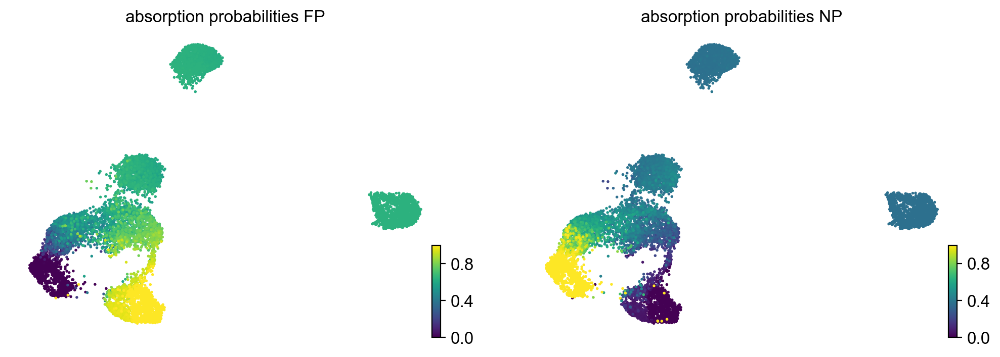

In [70]:
g.plot_absorption_probabilities(discrete = True, 
                                same_plot = False, 
                                save=os.path.join(outDir, "cellrank_absorption_probs_vk0.5_pk0.3_ck0.2.pdf"))

In [71]:
fp_drivers = g.compute_lineage_drivers(lineages="FP", return_drivers=True)
fp_drivers.sort_values(by="FP_corr", ascending=False)

Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:00)


,FP_corr,FP_pval,FP_qval,FP_ci_low,FP_ci_high
Vtn,0.572162,0.0,0.0,0.559153,0.584888
Igfbp5,0.551693,0.0,0.0,0.538245,0.564860
Shh,0.526285,0.0,0.0,0.512315,0.539977
Spon1,0.502620,0.0,0.0,0.488185,0.516779
Slit2,0.476911,0.0,0.0,0.461997,0.491554
...,...,...,...,...,...
Mir124-2hg,-0.448465,0.0,0.0,-0.463616,-0.433052
Pantr1,-0.525362,0.0,0.0,-0.539072,-0.511373
Plagl1,-0.529115,0.0,0.0,-0.542749,-0.515201
Sfrp1,-0.549265,0.0,0.0,-0.562483,-0.535766


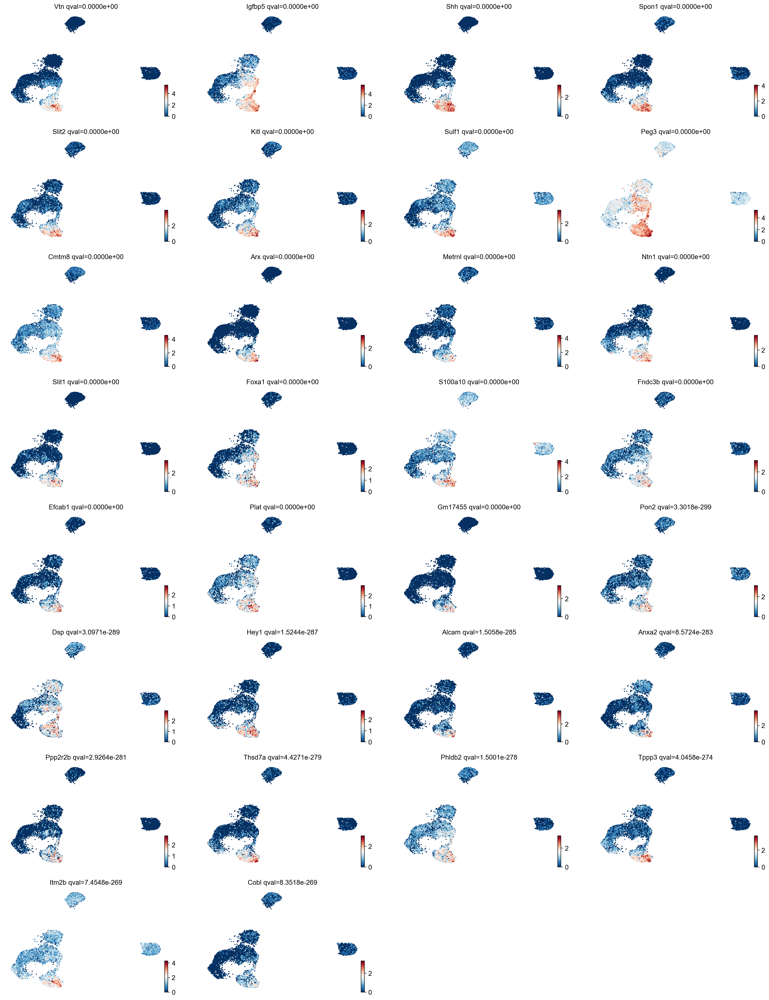

In [72]:
g.plot_lineage_drivers("FP", n_genes=30,
                      save=os.path.join(outDir, "cellrank_FP_drivers.pdf"))

In [73]:
nr_drivers = g.compute_lineage_drivers(lineages="NP", return_drivers=True)
nr_drivers.sort_values(by="NP_corr", ascending=False)

Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:00)


,NP_corr,NP_pval,NP_qval,NP_ci_low,NP_ci_high
Pax6,0.575710,0.0,0.0,0.562780,0.588359
Sfrp1,0.549264,0.0,0.0,0.535765,0.562482
Plagl1,0.529114,0.0,0.0,0.515201,0.542749
Pantr1,0.525361,0.0,0.0,0.511372,0.539071
Mir124-2hg,0.448464,0.0,0.0,0.433051,0.463615
...,...,...,...,...,...
Slit2,-0.476912,0.0,0.0,-0.491555,-0.461998
Spon1,-0.502621,0.0,0.0,-0.516780,-0.488186
Shh,-0.526287,0.0,0.0,-0.539978,-0.512316
Igfbp5,-0.551695,0.0,0.0,-0.564862,-0.538247


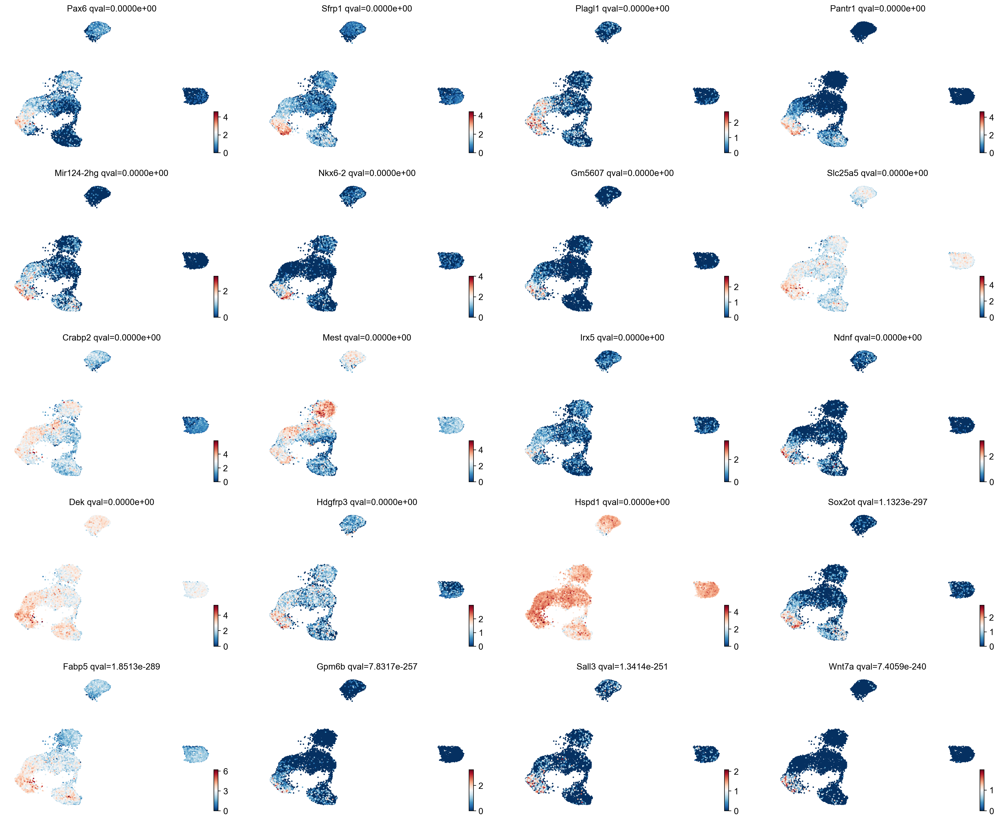

In [74]:
g.plot_lineage_drivers("NP", n_genes=20,
                       save=os.path.join(outDir, "cellrank_NP_drivers.pdf"))


In [75]:
fp_drivers.to_csv(os.path.join(outDir,'res_fp_drivers.csv'))
nr_drivers.to_csv(os.path.join(outDir,'res_np_drivers.csv'))

In [77]:
## save the pseudotime from scanpy
adata
adata.write(os.path.join(outDir,'my_results_scvelo_cellrank_dpt_pseudotime.h5ad'))

TypeError: No method has been defined for writing <class 'cellrank.tl._lineage.Lineage'> elements to <class 'h5py._hl.group.Group'>

Above error raised while writing key 'to_terminal_states' of <class 'h5py._hl.group.Group'> to /

In [ ]:
################# 
# Run CellRank using basic functions -- https://cellrank.readthedocs.io/en/stable/cellrank_basics.html
#################

In [ ]:
adata
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.5, min_mass=1,
    legend_fontsize=12, title="", color = "clusters"
)

In [ ]:
# Identify terminal states
# it did not work well, see issue in https://github.com/theislab/cellrank/issues/399
cr.tl.terminal_states(adata, 
                      n_states = 2, 
                      cluster_key="clusters", 
                      weight_connectivities=0.2, 
                      force_recompute = True)

In [ ]:
cr.pl.terminal_states(adata)

In [ ]:
# Identify initial states
cr.tl.initial_states(adata, 
                     n_states = 1, 
                     cluster_key="clusters")
cr.pl.initial_states(adata, discrete=True)

In [ ]:
# Compute fate maps
cr.tl.lineages(adata)
cr.pl.lineages(adata, same_plot=False)

In [ ]:
cr.pl.lineages(adata, same_plot=False, 
              save=os.path.join(input_Dir, "CellRank_fatemap_stochasticModel.pdf"))

In [ ]:
cr.pl.log_odds(
    adata,
    lineage_1="5",
    lineage_2="10",
    time_key="time",
    keys=["condition"],
    threshold=0,
    size=2,
    xticks_step_size=4,
    figsize=(9, 4),
)

In [ ]:
### Directed PAGA not used 

In [ ]:
scv.tl.recover_latent_time(
    adata, root_key="initial_states_probs", end_key="terminal_states_probs"
)

In [ ]:
scv.tl.paga(
    adata,
    groups="condition",
    root_key="initial_states_probs",
    end_key="terminal_states_probs",
    use_time_prior="velocity_pseudotime",
)


In [ ]:
cr.pl.cluster_fates(
    adata,
    mode="paga_pie",
    cluster_key="condition",
    basis="umap",
    legend_kwargs={"loc": "top right out"},
    legend_loc="top left out",
    node_size_scale=5,
    edge_width_scale=1,
    max_edge_width=4,
    title="directed PAGA",
    save=os.path.join(input_Dir, "CellRank_PAGA_fateProb_condition_umapV3.pdf")
)


In [ ]:
scv.tl.paga(
    adata,
    groups="clusters",
    root_key="initial_states_probs",
    end_key="terminal_states_probs",
    use_time_prior="velocity_pseudotime",
)
cr.pl.cluster_fates(
    adata,
    mode="paga_pie",
    cluster_key="clusters",
    basis="umap",
    legend_kwargs={"loc": "top right out"},
    legend_loc="top left out",
    node_size_scale=5,
    edge_width_scale=1,
    max_edge_width=4,
    title="directed PAGA",
    save=os.path.join(input_Dir, "CellRank_PAGA_fateProb_clusters_umapV3.pdf"),
)
